### Analyse egocentric VK network.

In [1]:
import networkx as nx
import igraph as ig
from community import community_louvain
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import pandas as pd
import matplotlib.cm as cm
import numpy as np
from matplotlib.pyplot import figure
import scipy as sp
from sklearn.cluster import KMeans
from scipy.linalg import eigh
%matplotlib inline

In [2]:
def draw(G, pos, measures, measure_name):
    ''' функция отрисовки метрик центральности '''
    
    figure(figsize=(14, 14), dpi=200)
    
    nodes = nx.draw_networkx_nodes(G, pos, node_size=10, alpha=0.6, cmap=plt.cm.plasma, 
                                   node_color=list(measures.values()),
                                   nodelist=measures.keys())
    nodes.set_norm(mcolors.SymLogNorm(linthresh=0.01, linscale=1, base=10))
    # labels = nx.draw_networkx_labels(G, pos)
    edges = nx.draw_networkx_edges(G, pos, alpha=0.02)

    plt.title(measure_name)
    plt.colorbar(nodes)
    plt.axis('off')
    plt.show()

In [3]:
NETWORK_DATA_PATH = '../data/network_data.csv'

In [4]:
network_data_df = pd.read_csv(NETWORK_DATA_PATH)

In [5]:
G_vk = nx.from_pandas_edgelist(network_data_df)

In [6]:
pos = nx.drawing.spring_layout(G_vk)

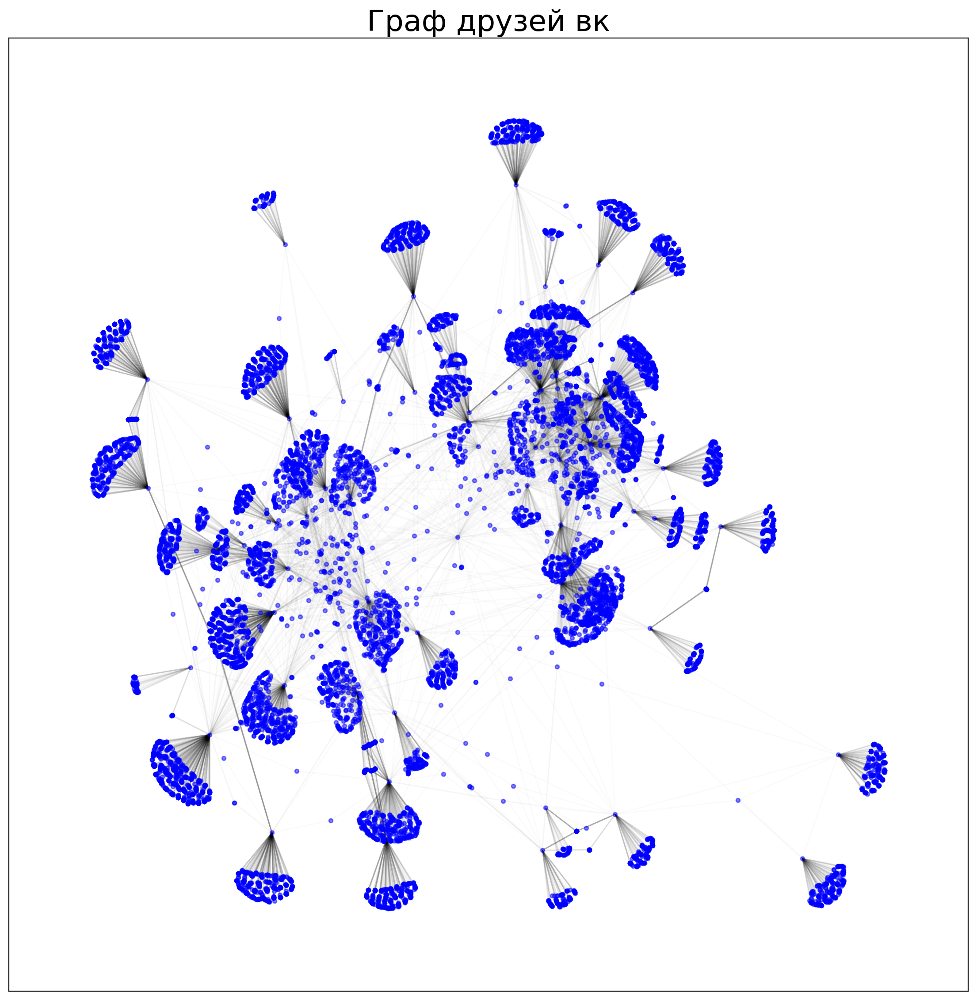

In [26]:
figure(figsize=(14, 14), dpi=200)
nx.draw_networkx_nodes(G_vk, pos=pos, node_size=10, alpha=0.6, node_color='blue')
nx.draw_networkx_edges(G_vk, pos, alpha=0.02)
plt.title('Граф друзей вк', fontsize=24);

### 1. Compute centrality measures for your egocentric VK network from HA-2: degree, closeness, betweenness, eigenvector; interpret the ranking results (does ranking make sense?).

### 2. Find network communities using either `igraph` or `community-louvain` package, analyse the results, can you identify clusters related to your egocentric network?

### 3. Using different layouts plot your network (you can use different node characteristics including clustering labels as node size/color). 

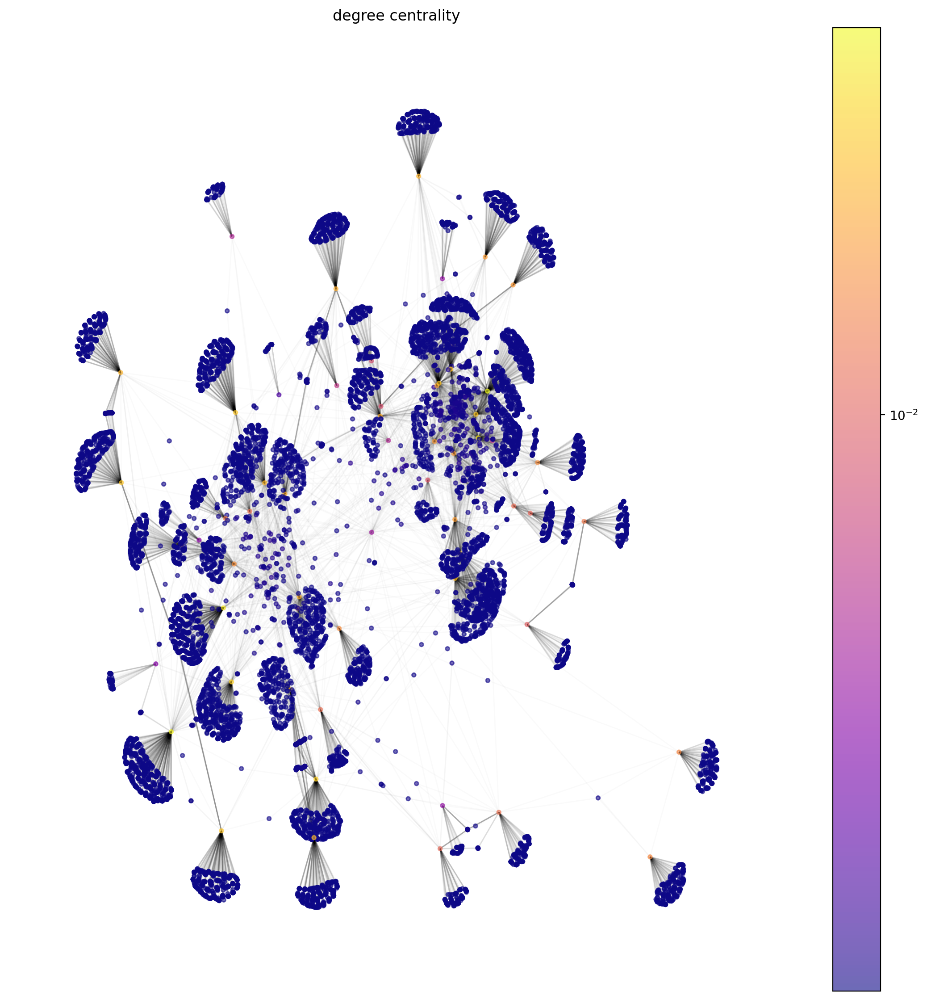

In [28]:
draw(G_vk, pos, nx.degree_centrality(G_vk), 'degree centrality');

Метрика degree centrality разметить вершины по степени. Таким образом, чем ближе цвет узла к желтому — тем больше у пользователя друзей.

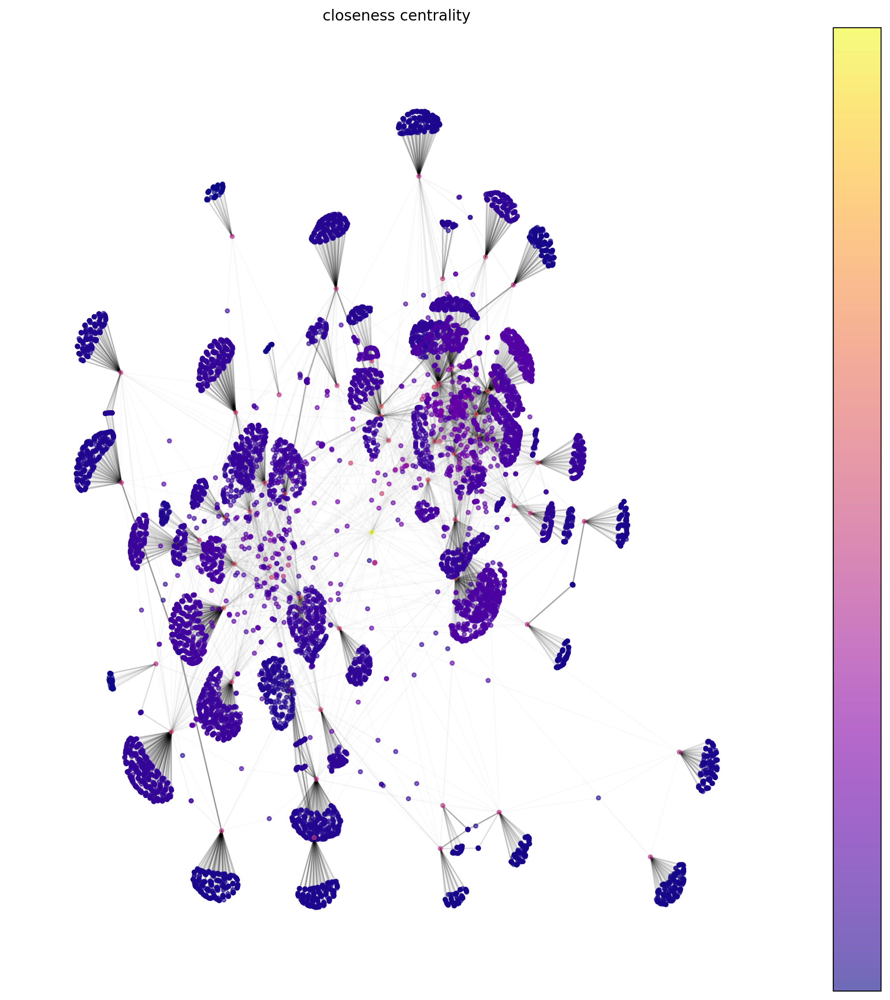

In [29]:
draw(G_vk, pos, nx.closeness_centrality(G_vk), 'closeness centrality');

Метрика близости позволила классифицировать пользователей по близости. Таким образом, скорее всего желтая точка — это мой пользователь, розовые — это мои друзья, а синие — друзья моих друзей.

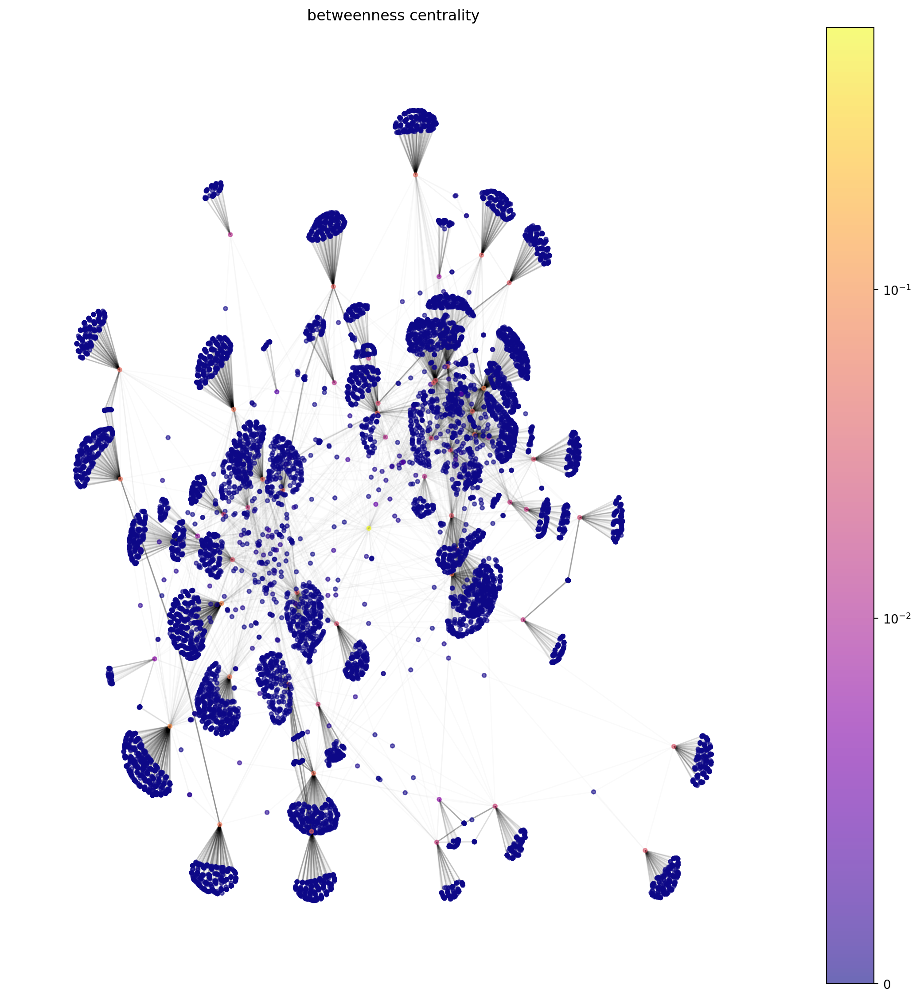

In [30]:
draw(G_vk, pos, nx.betweenness_centrality(G_vk), 'betweenness centrality');

betweenness centrality рассчитывается в соответствии с кратчайшими путями. Таким образом, желтая точка — мой пользователь, т.к. от меня существует наибольшее кол-во кратчайших путей ко всем пользвателям в графе.

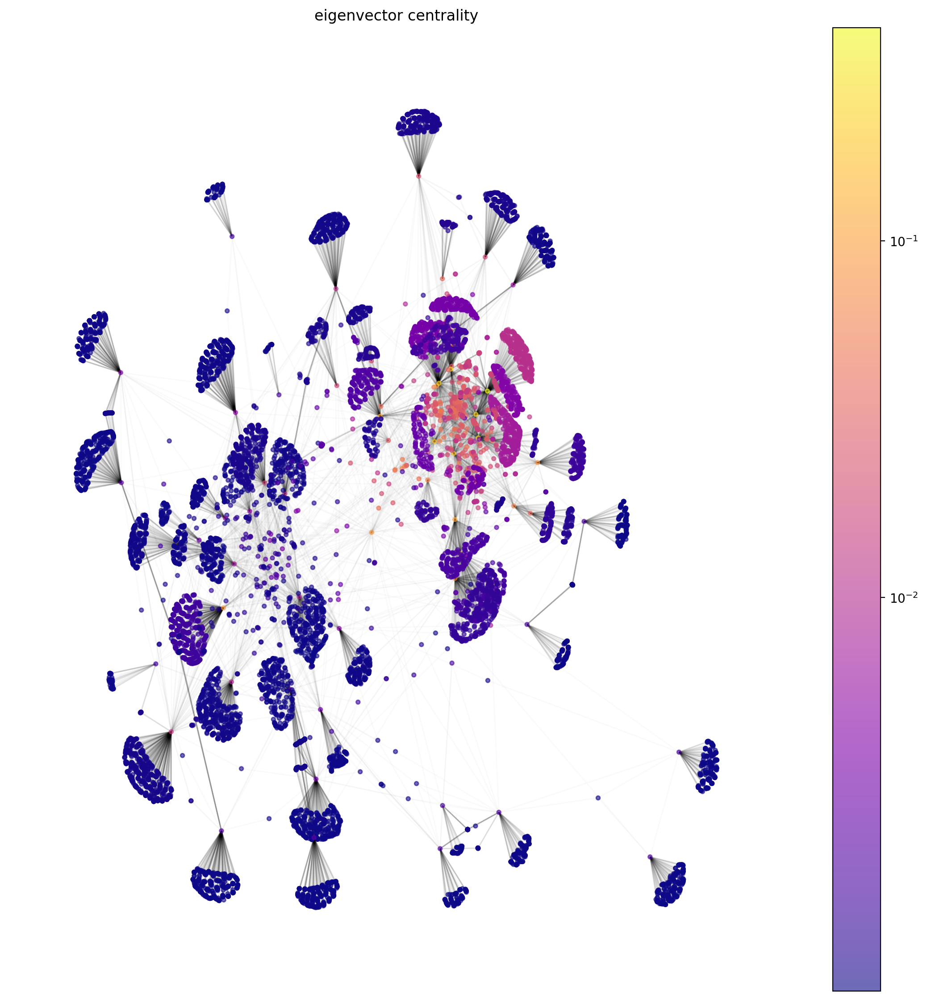

In [31]:
draw(G_vk, pos, nx.eigenvector_centrality(G_vk), 'eigenvector centrality');

eigenvector centrality зависит от важности соседей. таким образом, наиболее важными узлами в графе являюсь я и мои друзья, а друзья друзей имеют меньшую важность, поэтому чем дальше от меня находится вершина, тем она более синяя.

/var/folders/qs/y8j1xfxj3gsgry0y703t97jr0000gn/T/ipykernel_73829/594560651.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('hsv', max(partition.values()) + 1)


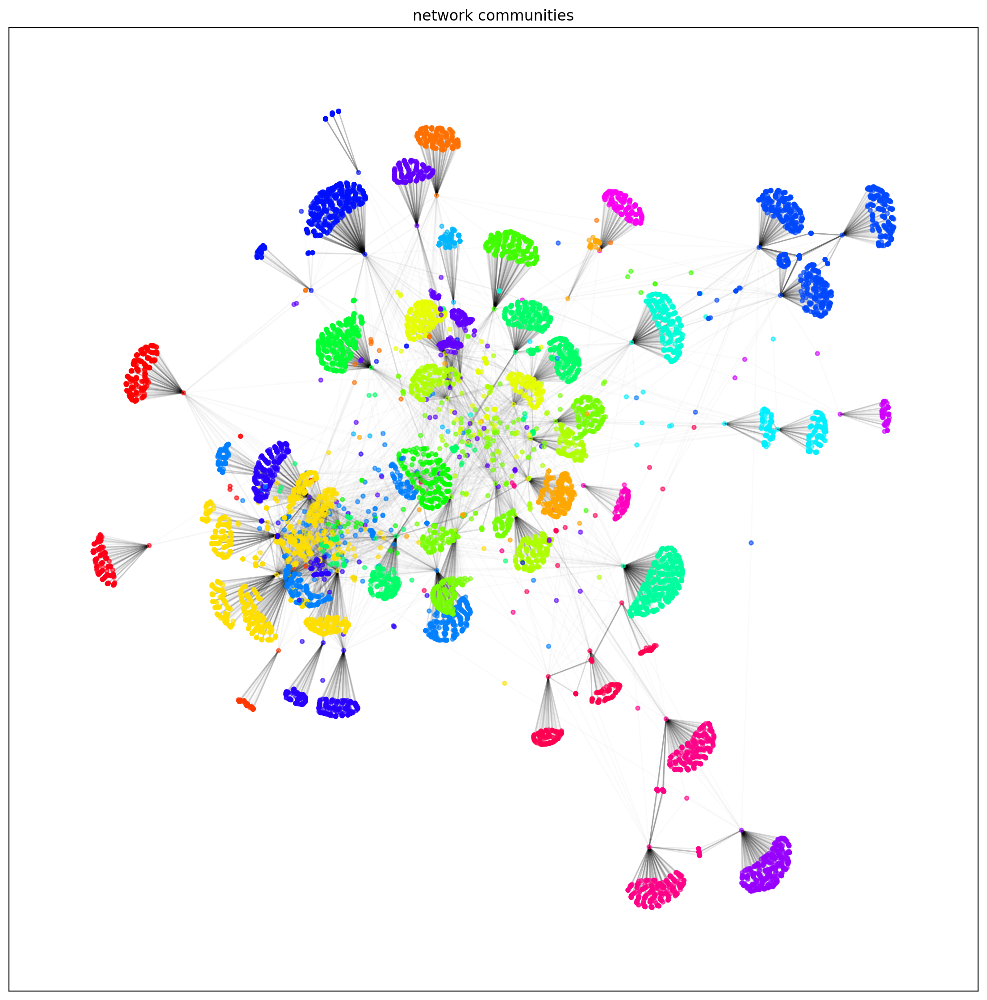

In [8]:
figure(figsize=(14, 14), dpi=200)
partition = community_louvain.best_partition(G_vk)
cmap = cm.get_cmap('hsv', max(partition.values()) + 1)
nx.draw_networkx_nodes(G_vk, pos, partition.keys(), node_size=10, alpha=0.6,
                        cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(G_vk, pos, alpha=0.02)
plt.title('network communities')
plt.show()

Выделенные кластеры представляют собой друзей, у каждого пользователя они в основном свои (общих с кем-то другими мало)

### Community detection using Spectral Clustering

Given graph $G$ with $n$ nodes, find non-overlapping node "communities": $k$ groups of nodes that are densely intra connected and have low number of inter connections.

- Compute square diagonal matrix of node degrees $D$. 
    $$D_{ii} = \sum_i A_{ij}, D_{ij} = 0, i \neq j$$
- Construct graph Laplacian 
    $$L_{unnormed} = D - A$$
Find $0 = \lambda_0 \leq \lambda_1 \leq \lambda_2 \leq \ldots \leq \lambda_m$ smallest eigenvalues of $L$ and construct matrix $X$ by stacking $m$ corresponding eigenvectors ($v_1, \ldots v_m$) as columns of $X$. Matrix $X$ has size $n \times m$, its rows are "spectral representaion" of graph nodes.
   
- Run k-means algorithm on matrix X and assign nodes with labels obtained by k-means.

> You can use numpy/scipy eigenvector routines and sklearn KMeans
---

Implement 3 algorithms described in https://arxiv.org/abs/0711.0189 :
1. Unnormalized spectral clustering 
2. Normalized spectral clustering according to Shi and Malik (2000)
3. Normalized spectral clustering according to Ng, Jordan, and Weiss (2002)

In [51]:
def get_L(G):
    ''' graph Laplacian '''
    
    nodes = list(G)
    A = nx.to_scipy_sparse_array(G, nodelist=nodes, format="csr")
    n, m = A.shape
    D = sp.sparse.csr_array(sp.sparse.spdiags(A.sum(axis=1), 0, m, n, format="csr"))
    
    return D - A

def get_D(G):
    ''' square diagonal matrix of node degrees D '''
    
    nodes = list(G)
    A = nx.to_scipy_sparse_array(G, nodelist=nodes, format="csr")
    n, m = A.shape
    D = sp.sparse.csr_array(sp.sparse.spdiags(A.sum(axis=1), 0, m, n, format="csr"))
    
    return D

def spectral_clustering(G, pos, k_num):
    ''' Unnormalized spectral clustering '''
    
    L = get_L(G)
    e, v = np.linalg.eig(L.todense()) 
    idx = np.argsort(e)
    e = e[idx]
    v = v[:,idx]

    v_k = v[:, :k_num]  
    
    # sns.heatmap(L.toarray(), cmap='viridis_r');  # Laplasian
    # sns.heatmap(v_k, cmap='viridis_r');

    lbls = KMeans(n_clusters=k_num).fit_predict(v_k)

    nx.draw(
            G, 
            pos=pos, 
            with_labels=True, 
            node_color=lbls
            )
       
    plt.title(f"Unnormalized spectral clustering, {k_num} clusters");
    
    return lbls
    
def normalized_1_spectral_clustering(G, pos, k_num):
    ''' Normalized spectral clustering according to Shi and Malik (2000) '''
    
    L = get_L(G).toarray()
    D = get_D(G).toarray()
    
    w = eigh(L, D, eigvals_only=False, subset_by_index=[0, k_num-1])
    e = w[0]
    v_k = w[1]

    lbls = KMeans(n_clusters=k_num).fit_predict(v_k)

    nx.draw(
            G, 
            pos=pos, 
            with_labels=True, 
            node_color=lbls
            )
    
    plt.title(f"Normalized spectral clustering according to Shi and Malik (2000), {k_num} clusters");
    
    return lbls

def normalized_2_spectral_clustering(G, pos, k_num):
    ''' Normalized spectral clustering according to Ng, Jordan, and Weiss (2002) '''
    
    L = nx.normalized_laplacian_matrix(G)
    e, v = np.linalg.eig(L.todense()) 
    e, v = np.linalg.eig(L.todense()) 
    idx = np.argsort(e)
    e = e[idx]
    v = v[:,idx]
    v_k = v[:, :k_num] 

    T = np.zeros(v_k.shape)
    
    for i in range(v_k.shape[0]):
        norm = 0.
        for j in range(v_k.shape[1]):
            T[i, j] = v_k[i, j]
            norm += v_k[i, j]*v_k[i, j]
        
        norm = np.sqrt(norm)
        for j in range(v_k.shape[1]):
            T[i, j] = v_k[i, j]/norm

    lbls = KMeans(n_clusters=k_num).fit_predict(T)

    nx.draw(
            G, 
            pos=pos, 
            with_labels=True, 
            node_color=lbls
            )
    
    plt.title(f"Normalized spectral clustering according to Ng, Jordan, and Weiss (2002), {k_num} clusters");
    
    return lbls


## Compare 3 versions of Spectral clustering on `Karate Club dataset` using
1. `Adjusted Rand Index` (3 pairwise comparisons),
2. (implement) `Modularity` (3 numbers):
$$ Q(A, c) = \frac{1}{2m} \sum (A_{ij} - \frac{k_i k_j}{2m}) [c_i == c_j]  $$
3.  and visually, plotting points in a corresponding 2 dimensional spaces (spanned by eigenvectors).

Theoretical questions:

1. Why does the smallest eigenvalue of unnormalized Laplacian is always equal to 0? 
2. From network point of view, what does Symmetric normalization do? 
3. Under what conditions Symmetric and Random walk normalizations yield the same result? 
  
    
Sources:
- Andrew Ng paper on spectral clustering https://ai.stanford.edu/~ang/papers/nips01-spectral.pdf
- Tutorial on spectral clustering with multiple theoretical views on the problem https://arxiv.org/abs/0711.0189
- Amazing explanation from James R. Lee https://www.youtube.com/watch?v=8XJes6XFjxM

In [10]:
from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score
from scipy import linalg # https://docs.scipy.org/doc/scipy/reference/linalg.html#eigenvalue-problems

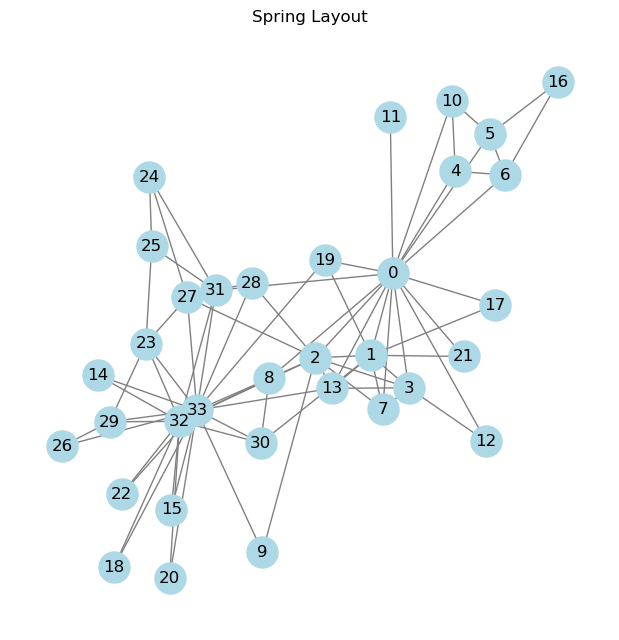

In [64]:
G = nx.karate_club_graph()
pos_spring = nx.spring_layout(G)
plt.figure(figsize=(6, 6))
nx.draw(G, pos=pos_spring, with_labels=True, node_color='lightblue', edge_color='gray', node_size=500)
plt.title("Spring Layout");

/Users/ftn/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


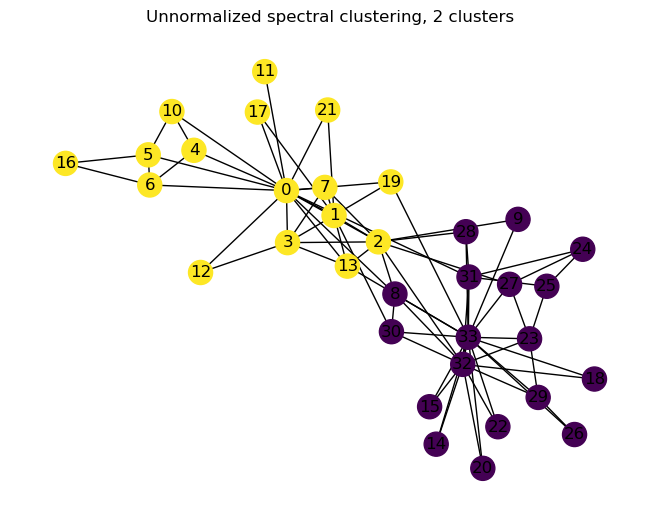

/Users/ftn/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


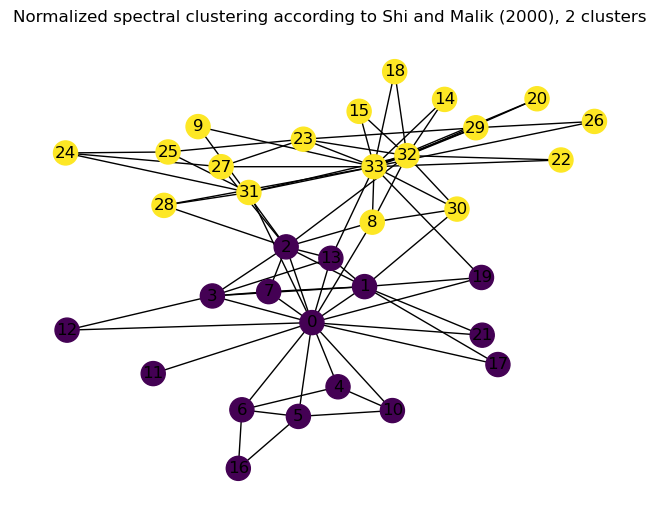

/Users/ftn/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


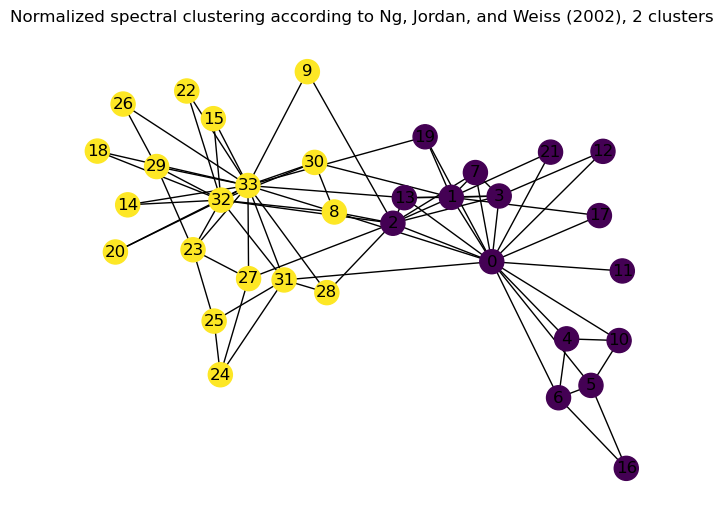

In [65]:
k_num = 2 # количество кластеров

unnorm_labels = spectral_clustering(G, pos=nx.drawing.layout.spring_layout(G), k_num=k_num)
plt.show()

norm_labels1 = normalized_1_spectral_clustering(G, pos=nx.drawing.layout.spring_layout(G), k_num=k_num)
plt.show()

norm_labels2 = normalized_2_spectral_clustering(G, pos=nx.drawing.layout.spring_layout(G), k_num=k_num)
plt.show()

In [66]:
print(f'{k_num} clusters')
print(f'unnorm clustering, normalizing (She, Malik): {adjusted_rand_score(unnorm_labels, norm_labels1)}') 
print(f'unnorm clustering, normalizing (Ng, Jordan, Weiss): {adjusted_rand_score(unnorm_labels, norm_labels2)}') 
print(f'normalizing (She, Malik), normalizing (Ng, Jordan, Weiss): {adjusted_rand_score(norm_labels1, norm_labels2)}') 

2 clusters
unnorm clustering, normalizing (She, Malik): 1.0
unnorm clustering, normalizing (Ng, Jordan, Weiss): 1.0
normalizing (She, Malik), normalizing (Ng, Jordan, Weiss): 1.0


кластеризация графа Karate Club 3 алгоритмами на 2 кластера дала одинаковое разбиение.

/Users/ftn/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


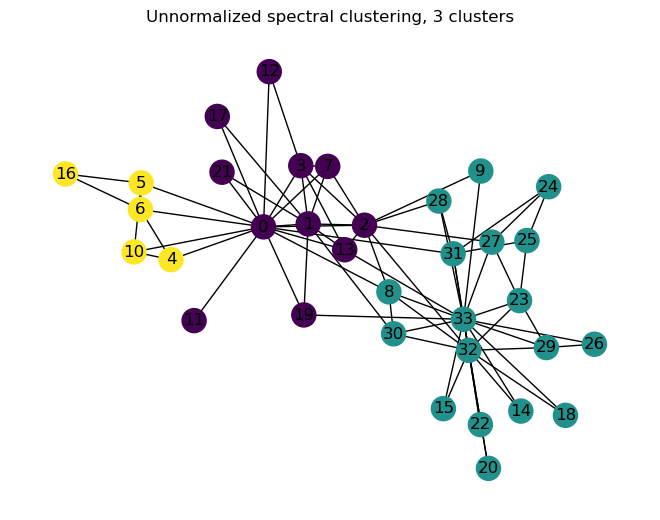

/Users/ftn/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


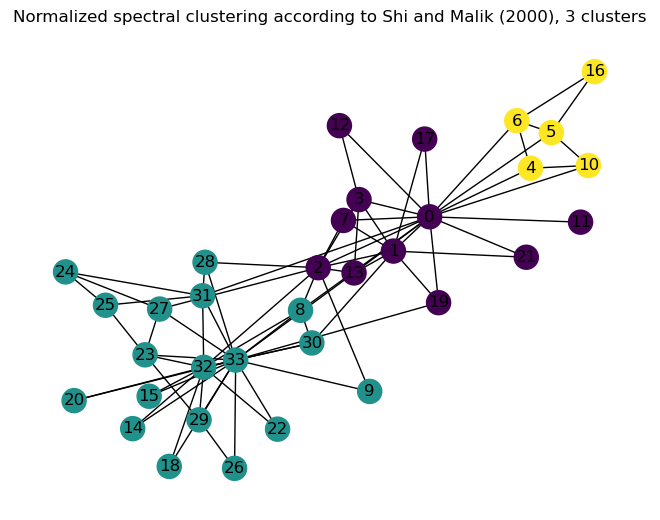

/Users/ftn/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


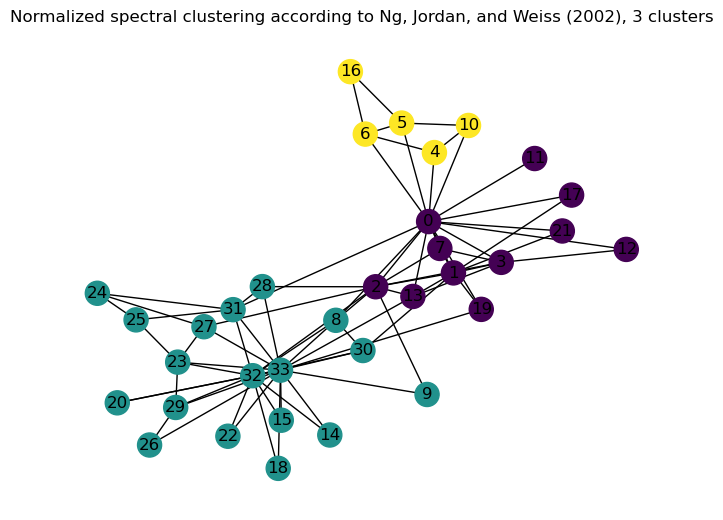

In [67]:
k_num = 3 # количество кластеров

unnorm_labels = spectral_clustering(G, pos=nx.drawing.layout.spring_layout(G), k_num=k_num)
plt.show()

norm_labels1 = normalized_1_spectral_clustering(G, pos=nx.drawing.layout.spring_layout(G), k_num=k_num)
plt.show()

norm_labels2 = normalized_2_spectral_clustering(G, pos=nx.drawing.layout.spring_layout(G), k_num=k_num)
plt.show()

In [68]:
print(f'{k_num} clusters')
print(f'unnorm clustering, normalizing (She, Malik): {adjusted_rand_score(unnorm_labels, norm_labels1)}') 
print(f'unnorm clustering, normalizing (Ng, Jordan, Weiss): {adjusted_rand_score(unnorm_labels, norm_labels2)}') 
print(f'normalizing (She, Malik), normalizing (Ng, Jordan, Weiss): {adjusted_rand_score(norm_labels1, norm_labels2)}') 

3 clusters
unnorm clustering, normalizing (She, Malik): 1.0
unnorm clustering, normalizing (Ng, Jordan, Weiss): 1.0
normalizing (She, Malik), normalizing (Ng, Jordan, Weiss): 1.0


кластеризация графа Karate Club 3 алгоритмами на 3 кластера дала одинаковое разбиение.

/Users/ftn/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


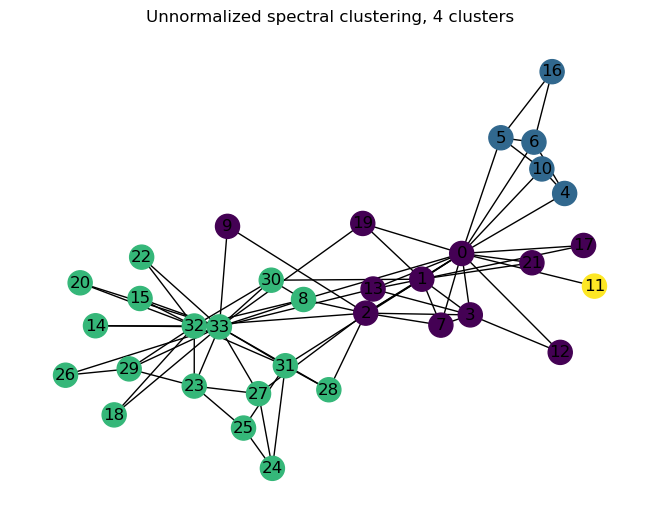

/Users/ftn/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


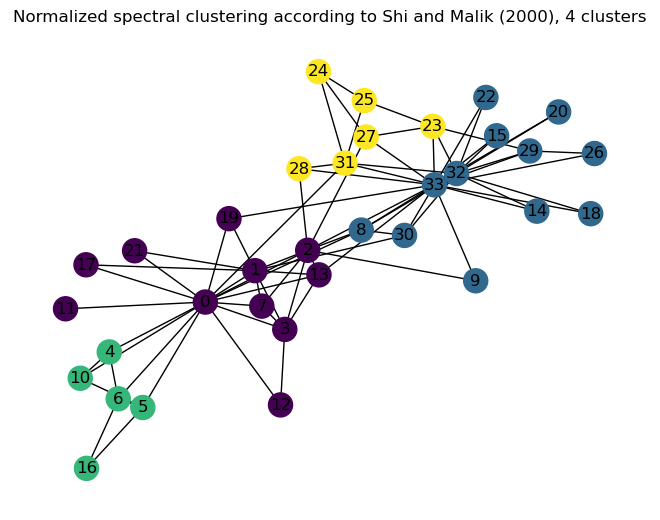

/Users/ftn/anaconda3/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


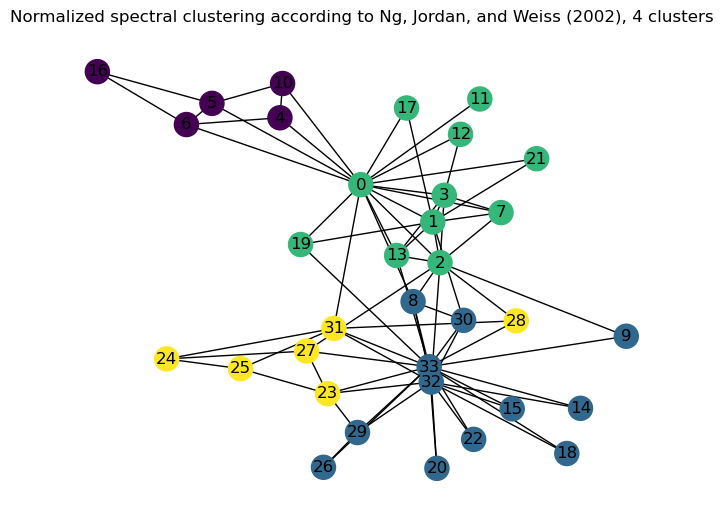

In [69]:
k_num = 4 # количество кластеров

unnorm_labels = spectral_clustering(G, pos=nx.drawing.layout.spring_layout(G), k_num=k_num)
plt.show()

norm_labels1 = normalized_1_spectral_clustering(G, pos=nx.drawing.layout.spring_layout(G), k_num=k_num)
plt.show()

norm_labels2 = normalized_2_spectral_clustering(G, pos=nx.drawing.layout.spring_layout(G), k_num=k_num)
plt.show()

In [70]:
print(f'{k_num} clusters')
print(f'unnorm clustering, normalizing (She, Malik): {adjusted_rand_score(unnorm_labels, norm_labels1)}') 
print(f'unnorm clustering, normalizing (Ng, Jordan, Weiss): {adjusted_rand_score(unnorm_labels, norm_labels2)}') 
print(f'normalizing (She, Malik), normalizing (Ng, Jordan, Weiss): {adjusted_rand_score(norm_labels1, norm_labels2)}') 

4 clusters
unnorm clustering, normalizing (She, Malik): 0.5998014340871484
unnorm clustering, normalizing (Ng, Jordan, Weiss): 0.5998014340871484
normalizing (She, Malik), normalizing (Ng, Jordan, Weiss): 1.0


разбиение графа Karate Club алгоритмами She, Malik и Ng, Jordan, Weiss на 4 кластера получается одинаковое. Кластеризация первым методом отличается.